In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import time
import pandas as pd

In [2]:
kernel = np.ones((3, 3), np.uint8)

window_size = 3
min_disp = 2
num_disp = 130 - min_disp
stereo = cv2.StereoSGBM_create(minDisparity=min_disp,
                               numDisparities=num_disp,
                               blockSize=window_size,
                               uniquenessRatio=10,
                               speckleWindowSize=100,
                               speckleRange=32,
                               disp12MaxDiff=5,
                               P1=8 * 3 * window_size ** 2,
                               P2=32 * 3 * window_size ** 2)

#stereo = cv2.StereoBM_create(numDisparities=16, blockSize=5)

In [3]:
yoloFiles = '/home/aman/Documents/Project/DepthCal/Code/Tiny Yolo Files/'

net = cv2.dnn.readNet(yoloFiles + 'yolov3-tiny.weights',yoloFiles + 'yolov3-tiny.cfg')
classes = []
with open(yoloFiles + 'coco.names','r') as f:
    classes = [line.strip() for line in f.readlines()]

layer_names = net.getLayerNames()
output_layers = [layer_names[i[0]-1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0,255,size = (len(classes),3))

In [4]:
path = "/home/aman/Documents/Project/DepthCal/Data/data/"

In [5]:
f = []
for files in os.listdir(path + "data/"):
    if files.endswith(".jpg"):
        f.append(files)

f.sort()

In [6]:
f

['IMG20200206175105.jpg',
 'IMG20200206175112.jpg',
 'IMG20200206175136.jpg',
 'IMG20200206175140.jpg',
 'IMG20200206175252.jpg',
 'IMG20200206175255.jpg',
 'IMG20200206175318.jpg',
 'IMG20200206175323.jpg',
 'IMG20200206175412.jpg',
 'IMG20200206175417.jpg',
 'IMG20200206175441.jpg',
 'IMG20200206175445.jpg',
 'IMG20200206175504.jpg',
 'IMG20200206175510.jpg',
 'IMG20200206175545.jpg',
 'IMG20200206175549.jpg',
 'IMG20200206175645.jpg',
 'IMG20200206175653.jpg',
 'IMG20200206175902.jpg',
 'IMG20200206175906.jpg',
 'IMG20200206175943.jpg',
 'IMG20200206175948.jpg',
 'IMG20200206180030.jpg',
 'IMG20200206180036.jpg',
 'IMG20200206180107.jpg',
 'IMG20200206180119.jpg',
 'IMG20200206180157.jpg',
 'IMG20200206180203.jpg',
 'IMG20200206180250.jpg',
 'IMG20200206180257.jpg',
 'IMG20200206180329.jpg',
 'IMG20200206180335.jpg',
 'IMG20200206180355.jpg',
 'IMG20200206180400.jpg',
 'IMG20200206180508.jpg',
 'IMG20200206180514.jpg',
 'IMG20200206180559.jpg',
 'IMG20200206180604.jpg',
 'IMG2020020

In [7]:
def disp(frameL, frameR):
    grayR = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    grayL = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    
    disp = stereo.compute(grayL, grayR)
    disp = ((disp.astype(np.float32) / 16) - min_disp) / num_disp
    
    return disp

In [8]:
def objectDetection(img):
    li = []
    w = 0
    height,width,channels = img.shape
    blob = cv2.dnn.blobFromImage(img,.00392,(416,416), (0,0,0),True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    class_ids = []
    confidences = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence>.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)

                w = int(detection[2] * width)
                h = int(detection[3] * height)

                x0 = int(center_x - (w / 2))
                x1 = x0 + w

                y0 = int(center_y - (h / 2))
                y1 = y0 + h
                confidences.append(float(confidence))
                class_ids.append(class_id)
                
                if x0 < 0:
                    x0 = 0
                if x1 > width:
                    x1 = width
                if y0 < 0:
                    y0 = 0
                if y1 > height:
                    y1 = height
    if w>0:
        li = [x0, y0, x1, y1]
        
    return li

In [9]:
def depth(i):
    imgL = plt.imread(path + 'data/' + f[2*i])
    imgL = cv2.resize(imgL, (480, 720))
    liL = objectDetection(imgL)
    
    if len(liL)>0:
        imgR = plt.imread(path + 'data/' + f[2*i+1])
        imgR = cv2.resize(imgR, (480, 720))
        dis = disp(imgL, imgR)
            
        ct = 0
        d = 0
        for j in range(liL[1], liL[3]):
            for i in range(liL[0], liL[2]):
                if(dis[j, i] != 0):
                    d = d+dis[j, i]
                    ct = ct+1          
        
        if d > 0:
            d = d/ct
            disparity.append(d)
                
            cv2.rectangle(imgL, (liL[0], liL[1]), (liL[2], liL[3]), (255, 255, 255), 5)
                
            fig, (lView, rView, Disp) = plt.subplots(ncols=3, figsize=(16, 8))
            lView.imshow(imgL, 'gray')
            rView.imshow(imgR, 'gray')
            Disp.imshow(dis, 'gray')
            plt.show()
            
        else:
            disparity.append(0)
            
    else:
        disparity.append(0)

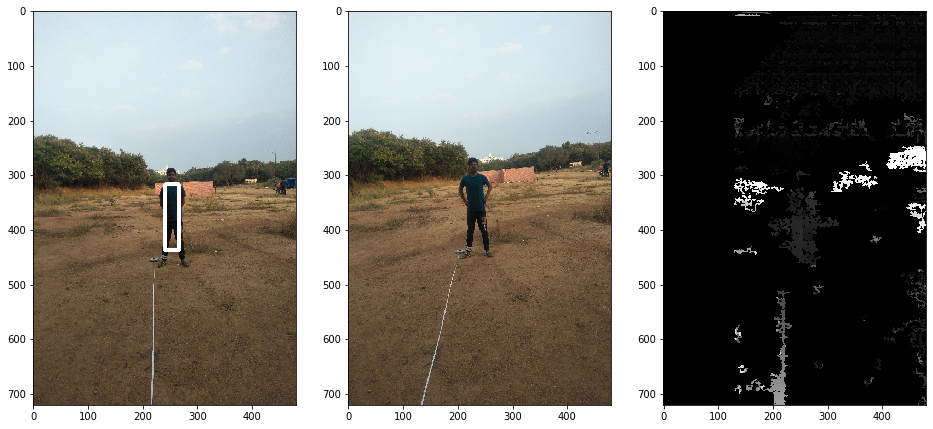

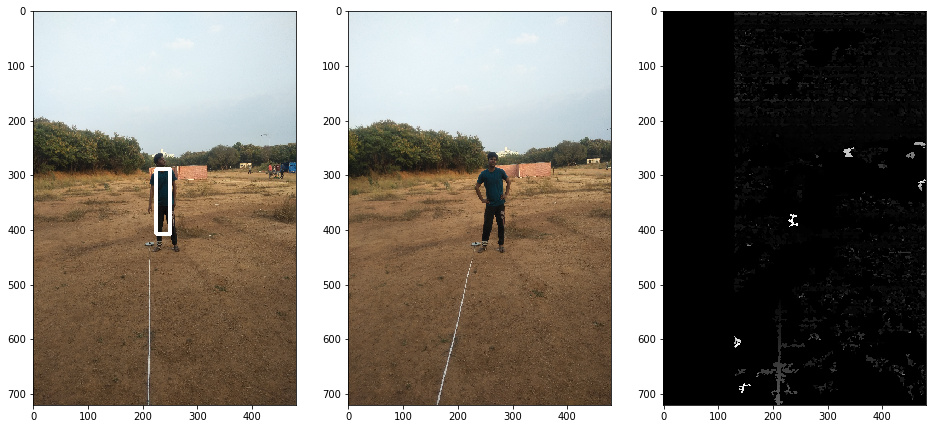

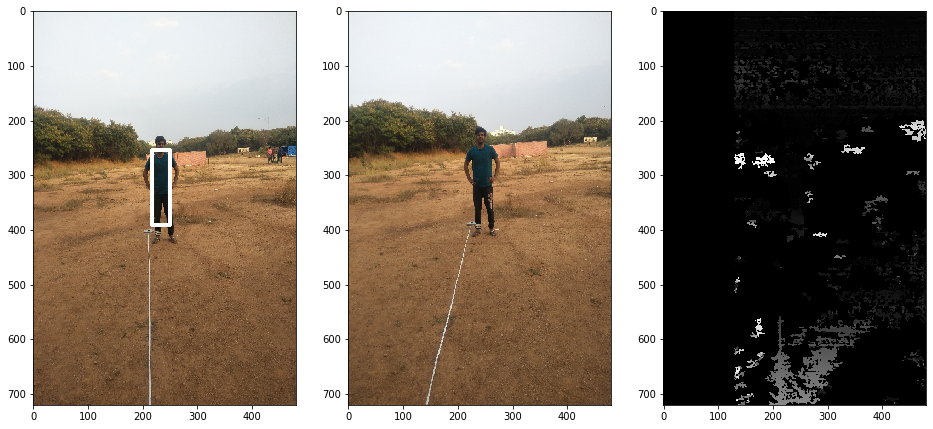

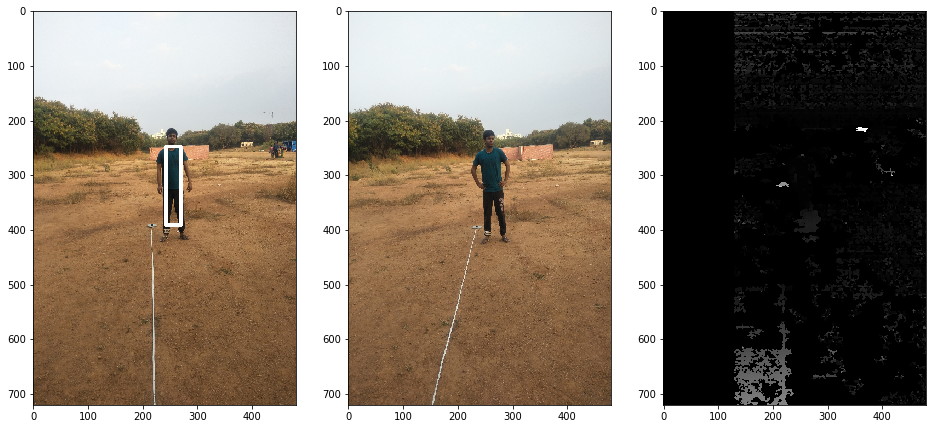

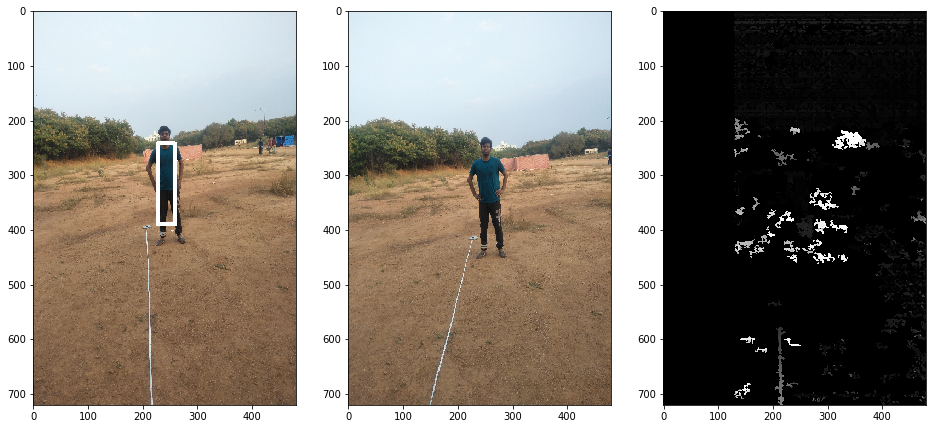

...

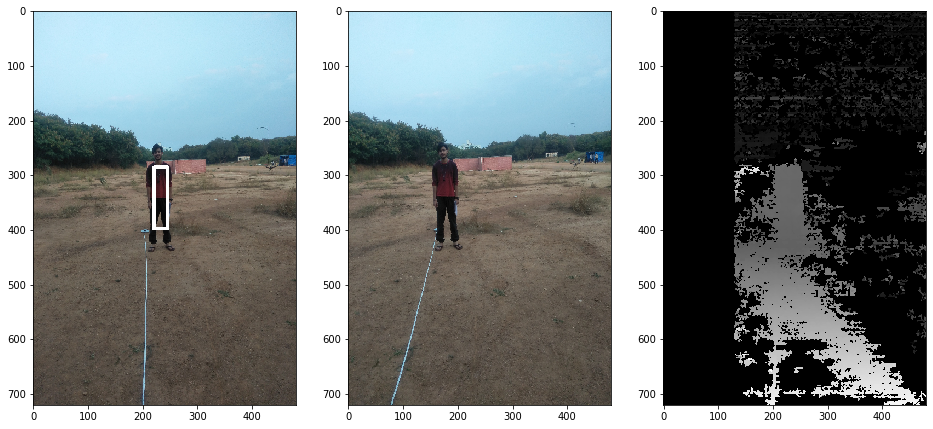

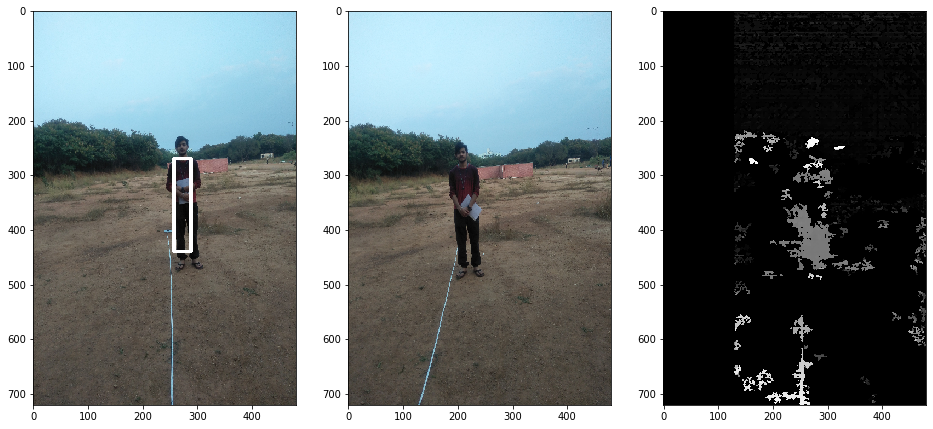

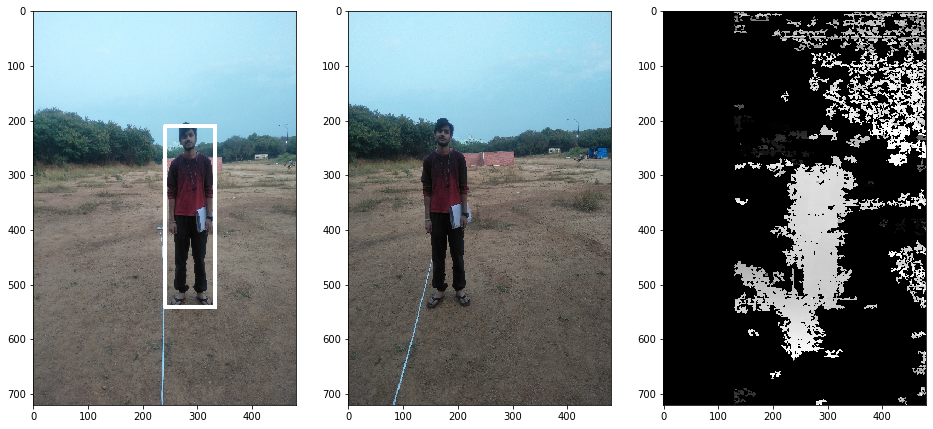

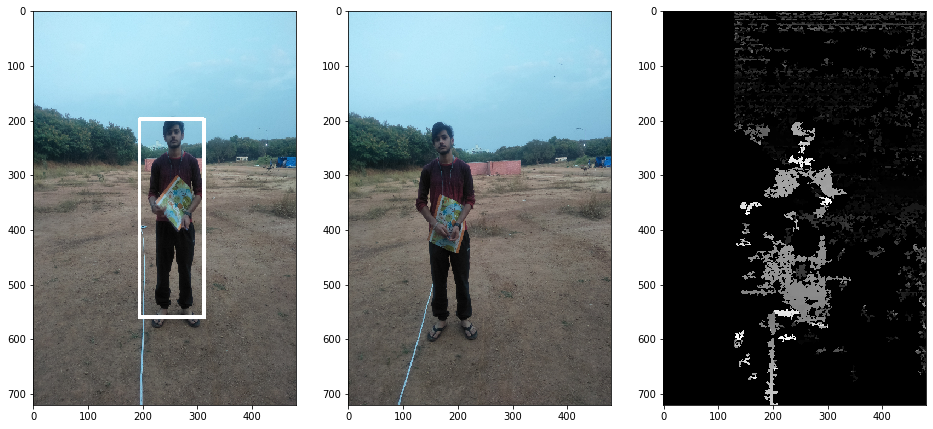

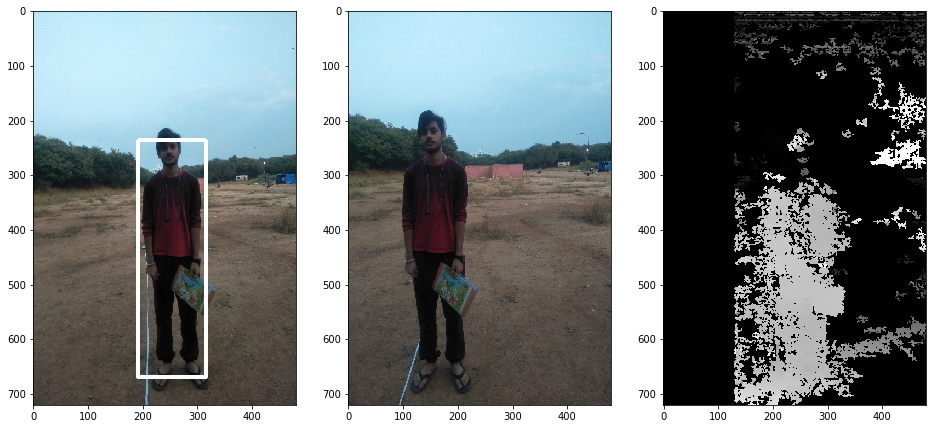

In [10]:
disparity = []

l = int(len(f)/2)
a = time.time()
for i in range(l):
    depth(i)
b = time.time()

In [11]:
seconds = b-a
seconds

28.05365252494812

In [12]:
fps = len(f)/seconds
fps

1.4258392900684853

In [13]:
aD = pd.read_csv(path + "distance1.csv", header = None)
li = [2.25, 1, 2.2]
aD = aD.rename(columns={0: "A"})
for i in range(3):
    aD = aD.append({"A": li[i]}, ignore_index=True)

In [14]:
disparity = disparity + [0.425, 0.6, 0.325]
disparity

[0.0889361118285124,
 0.056721883199025484,
 0.011898633605574013,
 0.026061796914278533,
 0.03833597029118573,
 0.07627506657047672,
 0.01734554603326234,
 0.04454738718006287,
 0.32159411179359954,
 0.23424554240659595,
 0.18155293994688176,
 0.6423758973340965,
 0.5572771744388545,
 0.3004748136658894,
 0.4391553795855978,
 0.3938310895647321,
 0.23734276787832068,
 0.5705105213126014,
 0.2067948380244471,
 0.4989493585776847,
 0.425,
 0.6,
 0.325]

In [15]:
len(aD)

23

In [16]:
len(disparity)

23

In [17]:
for i in range(l):
    print("Frame " + str(i) + " : " + str(disparity[i]) + " : " + str(aD.A[i]))

Frame 0 : 0.0889361118285124 : 5.0
Frame 1 : 0.056721883199025484 : 5.0
Frame 2 : 0.011898633605574013 : 4.75
Frame 3 : 0.026061796914278533 : 4.5
Frame 4 : 0.03833597029118573 : 4.25
Frame 5 : 0.07627506657047672 : 4.0
Frame 6 : 0.01734554603326234 : 4.0
Frame 7 : 0.04454738718006287 : 3.75
Frame 8 : 0.32159411179359954 : 3.5
Frame 9 : 0.23424554240659595 : 3.25
Frame 10 : 0.18155293994688176 : 3.0
Frame 11 : 0.6423758973340965 : 2.5
Frame 12 : 0.5572771744388545 : 2.25
Frame 13 : 0.3004748136658894 : 6.0
Frame 14 : 0.4391553795855978 : 5.5
Frame 15 : 0.3938310895647321 : 5.0
Frame 16 : 0.23734276787832068 : 4.0
Frame 17 : 0.5705105213126014 : 3.0
Frame 18 : 0.2067948380244471 : 2.5
Frame 19 : 0.4989493585776847 : 2.0


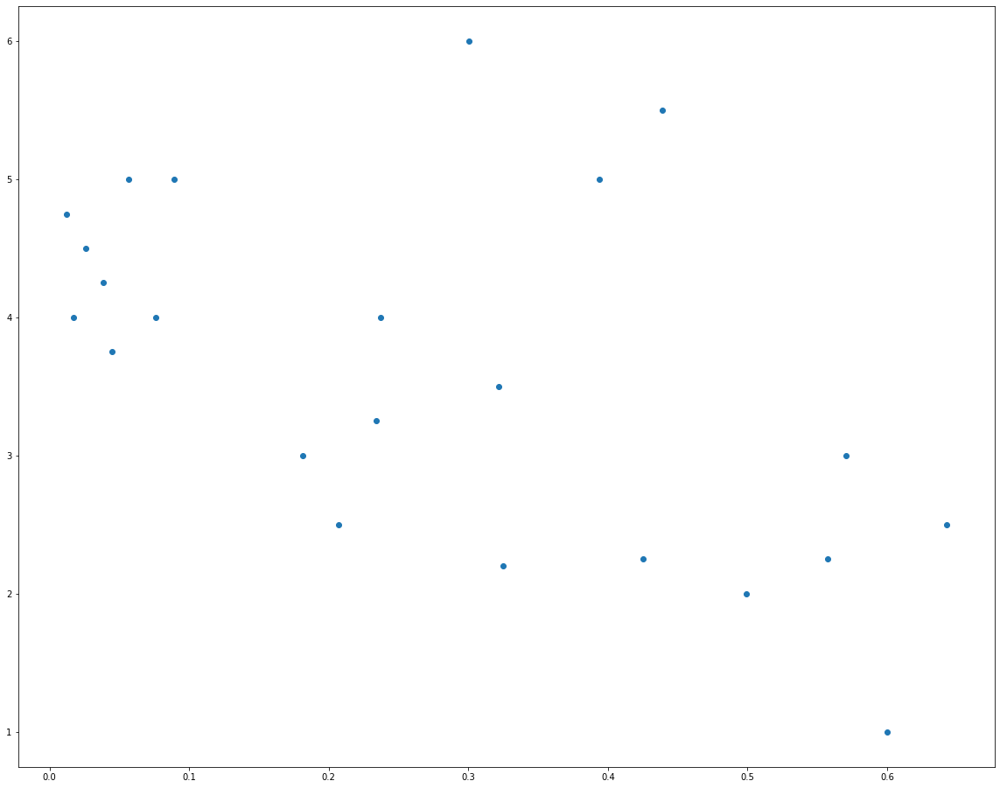

In [18]:
plt.figure(figsize = (20,16))
plt.scatter(disparity, aD.A)
plt.show()

In [19]:
df = pd.DataFrame(disparity)

In [20]:
ad = aD

In [21]:
ad

,A
0,5.00
1,5.00
2,4.75
3,4.50
4,4.25
5,4.00
6,4.00
7,3.75
8,3.50
9,3.25


In [22]:
ad['B'] = pd.DataFrame(df)

In [23]:
ad

,A,B
0,5.00,0.088936
1,5.00,0.056722
2,4.75,0.011899
3,4.50,0.026062
4,4.25,0.038336
5,4.00,0.076275
6,4.00,0.017346
7,3.75,0.044547
8,3.50,0.321594
9,3.25,0.234246


In [24]:
ad.to_csv("distDisp.csv", index = False)